<a href="https://colab.research.google.com/github/hentation/Spotify.ipynb/blob/main/spotify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Описание признаков

Импорт библиотек

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
import tensorflow as tf
%matplotlib inline

Unnamed: 0 — колонка, повторяющая индекс.

track_id — уникальный идентификатор песни, используемый для её поиска в базе данных.

artists — исполнитель или группа, записавшие данную композицию.

album_name — альбом, в состав которого входит трек.

track_name — название композиции.

popularity — уровень популярности песни, измеряемый по шкале от 0 до 100. Чем выше значение, тем популярнее трек.

duration_ms — продолжительность композиции в миллисекундах.

explicit — индикатор наличия ненормативной лексики. Значение True указывает на присутствие контента для взрослых, False — на его отсутствие.

danceability — показатель, отражающий пригодность трека для танцев. Принимает значения от 0 до 1.

energy — уровень «энергичности» песни, варьирующийся от 0 до 1. Высокий показатель характерен для быстрых и громких треков.

key — тональность композиции, представленная в числовом формате.

loudness — средний уровень громкости песни в децибелах (dB). Более высокие значения соответствуют громкому звуку.

mode — тип тональности: 1 — мажор, 0 — минор.

speechiness — степень речевого содержания в песне. Чем выше значение (от 0 до 1), тем больше словесного контента.

acousticness — уровень акустичности трека. Чем ближе показатель к 1, тем больше вероятность, что трек является акустическим.

instrumentalness — показатель инструментальности. Значения ближе к 1 указывают на отсутствие вокала, тогда как низкие значения могут свидетельствовать о его наличии.

liveness — отражает «живость» исполнения. Более высокие значения (от 0 до 1) сигнализируют о присутствии аудитории или элементах живого выступления.

valence — показатель эмоционального окраса композиции. Значение от 0 до 1, где высокие значения означают позитивное звучание, а низкие — меланхоличное.

tempo — темп композиции, выраженный в ударах в минуту (BPM).

time_signature — музыкальный размер, обозначающий количество долей в одном такте.

track_genre — жанр композиции.

# Загрузка и обработка Датасета

Загружаем данные из CSV файла

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Чтение данных в DataFrame

In [3]:
BASE_URL = '/content/drive/MyDrive/Colab Notebooks/'

In [4]:
data = pd.read_csv(f'{BASE_URL}dataset.csv')

In [5]:
data_initial = data.copy(deep=True)

In [6]:
data.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [7]:
data.shape

(114000, 21)

In [8]:
data_initial.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [9]:
data.shape

(114000, 21)

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [11]:
data['popularity'].value_counts()

,count
popularity,
0,16020
22,2354
21,2344
44,2288
1,2140
...,...
96,7
94,7
95,5


50 - 94

In [12]:
data['popularity'].unique()

array([ 73,  55,  57,  71,  82,  58,  74,  80,  56,  69,  52,  62,  54,
        68,  67,  75,  63,  70,   0,   1,  46,  61,  60,  51,  66,  64,
        65,  44,  45,  50,  59,  49,  53,  47,  43,  42,  20,  22,  35,
        19,  24,  18,  23,  40,  38,  41,  30,  37,  39,  48,  36,  34,
        26,  32,  33,  21,  31,  28,  29,  27,  25,  16,   3,  12,   7,
        10,   9,  11,  17,   8,  15,  87,  83,  86,  93,  76,  78,   4,
         2,   5,  85,  81,  84,  72,  79,  77,   6,  13,  14,  89,  96,
       100,  98,  88,  92,  90,  91,  99,  97,  95,  94])

In [13]:
data.isnull().sum()

,0
Unnamed: 0,0
track_id,0
artists,1
album_name,1
track_name,1
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0


In [14]:
data = data.dropna()

In [15]:
data.isnull().sum()

,0
Unnamed: 0,0
track_id,0
artists,0
album_name,0
track_name,0
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0


In [16]:
data.shape

(113999, 21)

In [17]:
numerical_features = data.select_dtypes(include=['number']).columns.tolist()
categorical_features = data.select_dtypes(include=['object']).columns.tolist()

In [18]:
numerical_features

['Unnamed: 0',
 'popularity',
 'duration_ms',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'time_signature']

In [19]:
categorical_features

['track_id', 'artists', 'album_name', 'track_name', 'track_genre']

In [20]:
categorical_cols = data.select_dtypes(include=['object']).columns
label_encoders = {}

In [21]:
from sklearn.preprocessing import LabelEncoder
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113999 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        113999 non-null  int64  
 1   track_id          113999 non-null  int64  
 2   artists           113999 non-null  int64  
 3   album_name        113999 non-null  int64  
 4   track_name        113999 non-null  int64  
 5   popularity        113999 non-null  int64  
 6   duration_ms       113999 non-null  int64  
 7   explicit          113999 non-null  bool   
 8   danceability      113999 non-null  float64
 9   energy            113999 non-null  float64
 10  key               113999 non-null  int64  
 11  loudness          113999 non-null  float64
 12  mode              113999 non-null  int64  
 13  speechiness       113999 non-null  float64
 14  acousticness      113999 non-null  float64
 15  instrumentalness  113999 non-null  float64
 16  liveness          113999 

# Аналитика


## Распределение популярности треков

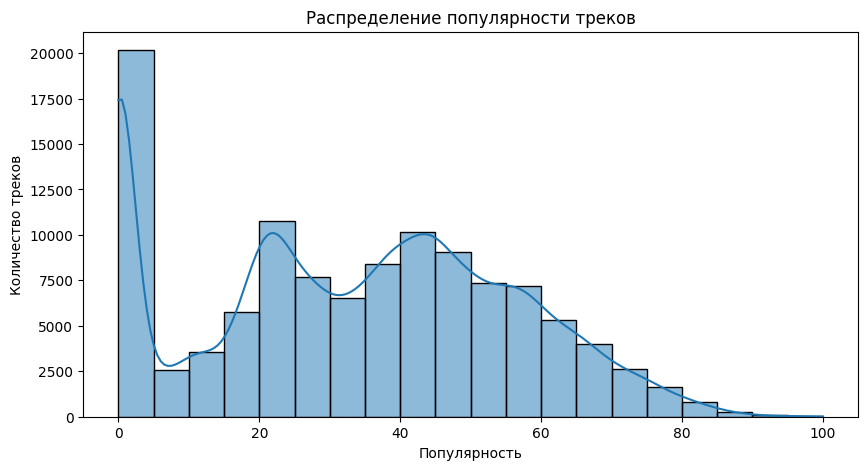

In [23]:
plt.figure(figsize=(10, 5))
sns.histplot(data['popularity'], bins=20, kde=True)
plt.title('Распределение популярности треков')
plt.xlabel('Популярность')
plt.ylabel('Количество треков')
plt.show()

График демонстрирует, что подавляющее большинство треков имеет нулевую популярность. Значительная часть треков сосредоточена в диапазоне популярности от 20 до 60. Треки с популярностью выше 80 составляют лишь незначительную долю, вероятно, около 1% от общего числа.

## Влияние настроения (valence) и танцевальности (danceability) на популярность

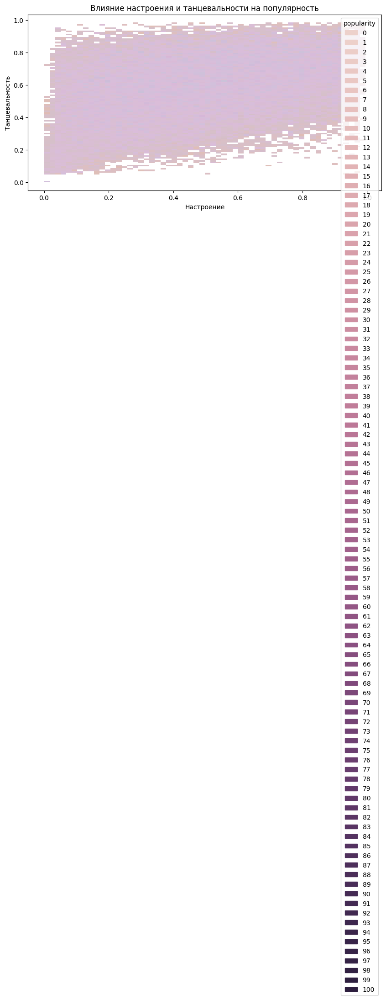

In [24]:
plt.figure(figsize=(10, 5))
sns.histplot(x='valence', y='danceability', hue='popularity', data=data)
plt.title('Влияние настроения и танцевальности на популярность')
plt.xlabel('Настроение')
plt.ylabel('Танцевальность')
plt.show()

На графике представлена зависимость популярности треков от настроения (valence) и танцевальности (danceability). Можно видеть, что треки с низкой танцевальностью (менее 0.2) вне зависимости от настроения имеют низкую популярность (0-5).

В целом, заметна некоторая тенденция к большей популярности треков с высоким настроением и средней или высокой танцевальностью. Однако, эта зависимость не является ярко выраженной, и существует множество популярных треков с разными сочетаниями настроения и танцевальности.

Также можно отметить, что очень популярные треки (свыше 60) встречаются довольно редко и распределены по всему диапазону настроения и танцевальности, хотя и с некоторым смещением в сторону более высоких значений. График не позволяет сделать однозначный вывод о том, какое сочетание настроения и танцевальности гарантирует высокую популярность трека. Скорее, он показывает, что другие факторы также играют значительную роль.

## Ящик с усами для популярности по жанрам

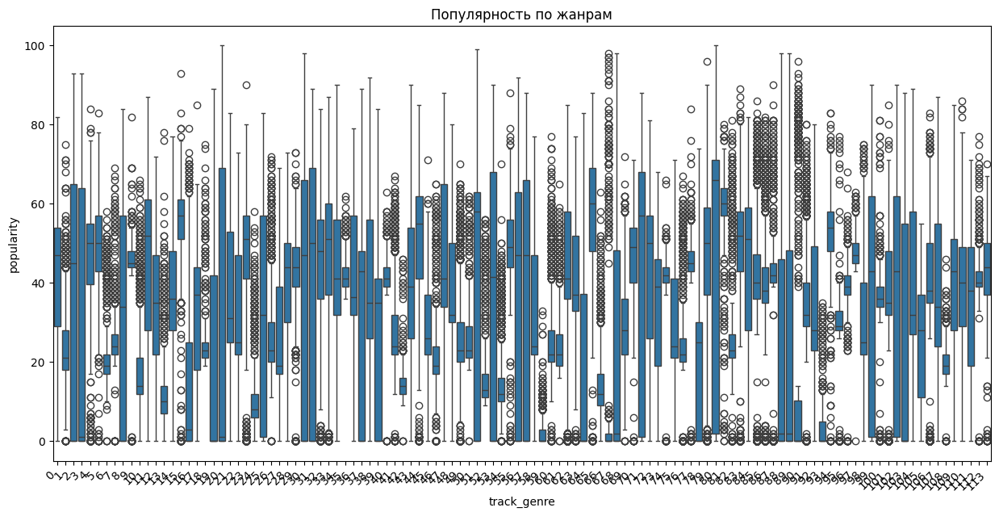

In [26]:
plt.figure(figsize=(15,7))
sns.boxplot(x='track_genre', y='popularity', data=data)
plt.xticks(rotation=45, ha='right')
plt.title('Популярность по жанрам')
plt.show()

Основные наблюдения:

Медианная популярность: Медианная популярность (полоса внутри ящика) для большинства жанров находится в диапазоне 40-60. Это говорит о том, что, в целом, треки имеют среднюю популярность.

Разброс популярности: Разброс значений популярности (высота ящика) сильно варьируется в зависимости от жанра. В некоторых жанрах разброс небольшой, в то время как в других — значительный, что указывает на большую вариативность популярности треков внутри жанра.

Выбросы: Практически во всех жанрах присутствуют выбросы (точки за пределами "усов"), что говорит о наличии треков со значительно более высокой или низкой популярностью, чем у большинства треков в данном жанре.

Жанры с высокой популярностью: Несколько жанров демонстрируют медианную популярность выше 60, что может свидетельствовать о большей общей популярности этих жанров. Однако, для более точного определения необходимо знать, какие именно жанры соответствуют каждому номеру на оси X.

Жанры с низкой популярностью: Есть жанры с очень низкой медианной популярностью и небольшим разбросом. Вероятно, эти жанры менее популярны в целом.

Популярность треков существенно различается в зависимости от жанра. В то время как большинство жанров имеют среднюю популярность, встречаются как очень популярные, так и непопулярные жанры, а также отдельные треки-выбросы с аномально высокой или низкой популярностью в пределах каждого жанра. Без информации о соответствии номеров жанрам сложно сделать выводы о конкретных жанрах.

## Влияние энергии на популярность

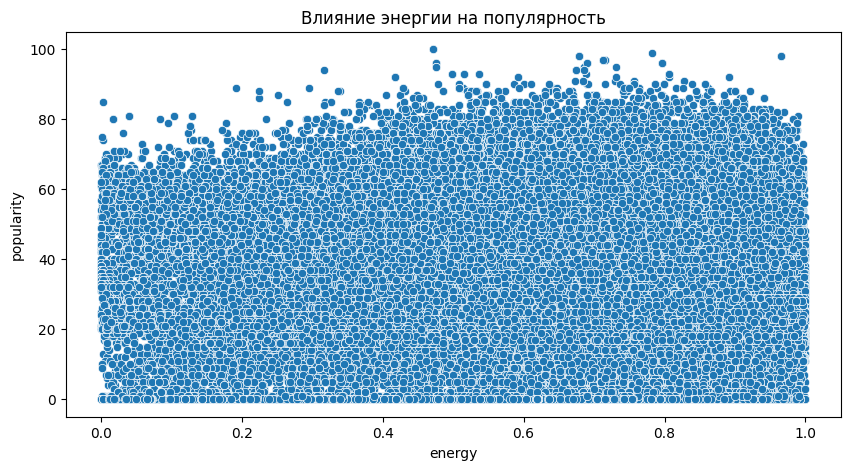

In [27]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x='energy', y='popularity', data=data)
plt.title('Влияние энергии на популярность')
plt.show()

Основные наблюдения:

Отсутствие явной корреляции: На графике не видно четкой линейной зависимости между энергетикой и популярностью. Точки распределены довольно равномерно по всей области графика, образуя почти прямоугольную форму.

Большинство треков имеют высокую энергетику: Большая часть точек сконцентрирована в области значений energy от 0.4 до 1.0, что говорит о том, что большинство треков в датасете имеют высокую энергетику.

Популярность в основном средняя: Независимо от уровня энергетики, большинство треков имеют популярность в диапазоне от 60 до 80.

Треки с низкой энергетикой редко бывают очень популярны: В области низких значений energy (менее 0.2) практически нет треков с популярностью выше 80.

Треки с высокой энергетикой могут иметь разную популярность: Треки с высокой энергетикой (более 0.8) имеют примерно одинаковое распределение популярности, что и треки с более низкой энергетикой. Среди них есть как популярные, так и непопулярные треки.

Энергетика трека сама по себе не является определяющим фактором его популярности. Треки с высокой энергетикой могут быть как популярными, так и нет. Другие факторы, помимо энергетики, влияют на популярность трека. Возможно, существуют более сложные зависимости, которые не проявляются на этой диаграмме

## Влияние акустичности на популярность

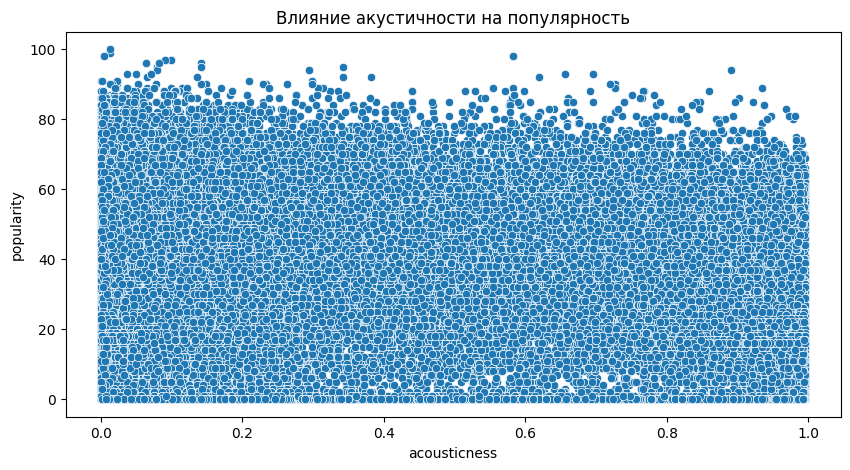

In [28]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x='acousticness', y='popularity', data=data)
plt.title('Влияние акустичности на популярность')
plt.show()


## Влияние инструментальности на популярность

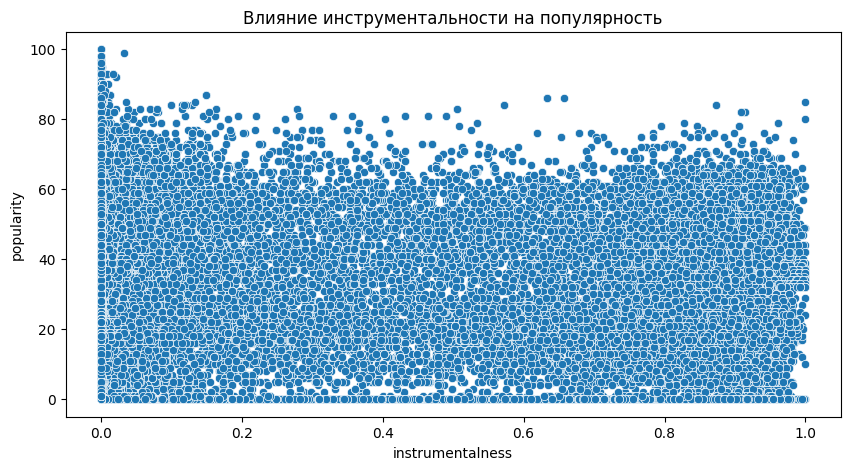

In [29]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='instrumentalness', y='popularity', data=data)
plt.title('Влияние инструментальности на популярность')
plt.show()

Основные наблюдения:

Слабая обратная корреляция: Можно заметить очень слабую тенденцию к снижению популярности с увеличением акустичности. Больше всего точек сосредоточено в левой части графика, где акустичность низкая, и эти области более плотные в верхней части, что указывает на более высокую популярность. Однако эта тенденция не является сильной, и много точек разбросано по всему графику.

Большинство треков не очень акустичны: Значительная часть треков имеет низкие значения акустичности (меньше 0.5).

Популярность распределена равномерно: Независимо от акустичности, треки охватывают весь диапазон популярности (от 0 до 100). Однако, треки с высокой популярностью (80-100) чаще встречаются при низкой акустичности.

Очень акустичные треки редко бывают очень популярны: Треки с очень высокой акустичностью (близкой к 1) в основном имеют популярность ниже 80.

 Существует слабая обратная зависимость между акустичностью и популярностью трека. Треки с низкой акустичностью имеют немного больше шансов быть популярными.

## Влияние "живости" на популярность

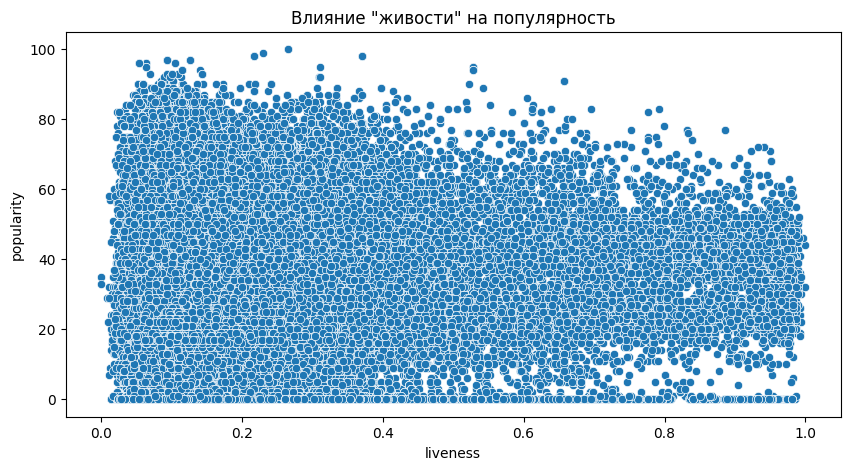

In [30]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x='liveness', y='popularity', data=data)
plt.title('Влияние "живости" на популярность')
plt.show()

Ключевые наблюдения:

Обратная корреляция: Наблюдается явная обратная корреляция между инструментальностью и популярностью. Чем выше инструментальность трека, тем ниже его популярность. Это особенно заметно в области высокой инструментальности (instrumentalness > 0.6), где популярность треков в основном низкая.

Большинство треков имеют низкую инструментальность: Основная масса точек сконцентрирована в левой части графика, где значения instrumentalness близки к нулю. Это означает, что большинство треков в датасете содержат вокал или другие неинструментальные элементы.

Инструментальные треки редко бывают очень популярны: Треки с высокой инструментальностью (ближе к 1) практически не встречаются среди высоко популярных (popularity > 80). В правой части графика почти нет точек выше уровня популярности 80.

Треки с низкой инструментальностью могут иметь разную популярность: Треки с низкой инструментальностью (instrumentalness < 0.2) демонстрируют широкий диапазон популярности - от очень низкой до очень высокой.

Инструментальность трека оказывает существенное влияние на его популярность. Высокая инструментальность, как правило, связана с низкой популярностью. Треки с вокалом или другими неинструментальными элементами имеют больше шансов стать популярными. Данный график наглядно демонстрирует, что инструментальная музыка, как правило, менее популярна, чем музыка с вокалом.

## Влияние тональности на популярность

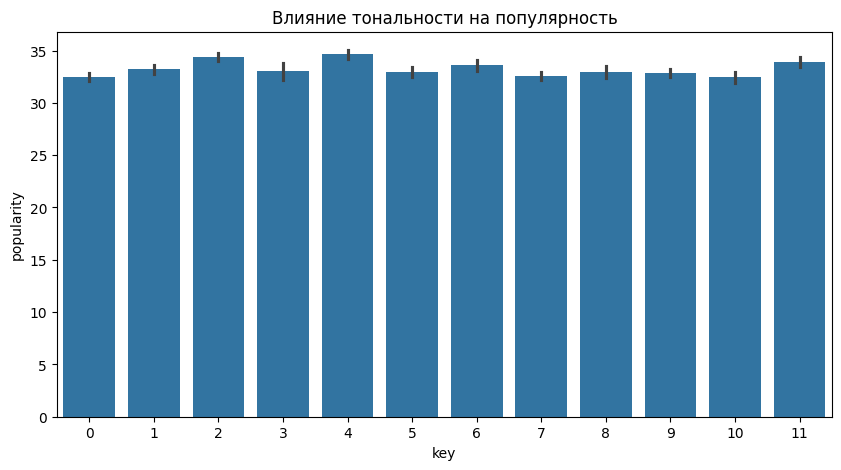

In [31]:
plt.figure(figsize=(10,5))
sns.barplot(x='key', y='popularity', data=data)
plt.title('Влияние тональности на популярность')
plt.show()


Ключевые наблюдения:

Незначительное влияние тональности: В целом, тональность, похоже, оказывает очень слабое влияние на популярность треков. Средняя популярность для всех тональностей колеблется в узком диапазоне от примерно 32 до 34.

Небольшие колебания: Несмотря на общую схожесть, есть незначительные различия в популярности между разными тональностями. Например, тональности 0, 3 и 4 кажутся немного более популярными, чем тональность 7. Однако эти различия очень малы и могут быть статистически незначимыми.

Отсутствие явных выбросов: Нет тональностей, которые бы выделялись значительно более высокой или низкой популярностью по сравнению с остальными.

Тональность, судя по этому графику, не является существенным фактором, влияющим на популярность музыкальных треков. Различия в популярности между треками разных тональностей минимальны и, вероятно, объясняются другими факторами. Можно сказать, что популярность распределена практически равномерно по всем тональностям.

## Влияние режима на популярность

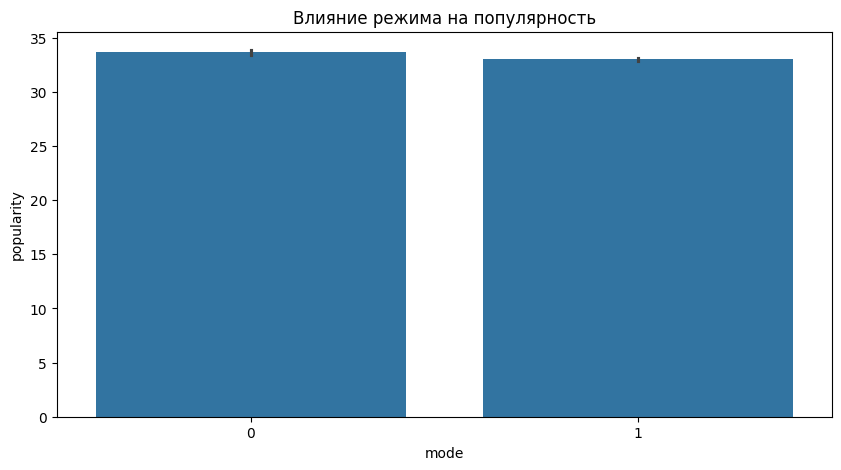

In [32]:
plt.figure(figsize=(10, 5))
sns.barplot(x='mode', y='popularity', data=data)
plt.title('Влияние режима на популярность')
plt.show()

Ключевые наблюдения:

Практически одинаковая популярность: Средняя популярность треков в мажорном и минорном ладах практически идентична. Оба столбца имеют высоту около 33-34, что говорит о незначительной разнице в популярности.

Незначительное преимущество мажора: Столбец для мажорного лада (mode = 1) может быть совсем немного выше, чем для минорного, но эта разница очень мала и может быть не значимой.

Модальность (лад) трека практически не влияет на его популярность. Как мажорные, так и минорные треки имеют примерно одинаковый уровень популярности. Другие факторы, помимо лада, вероятно, играют гораздо более важную роль в определении популярности музыкального произведения.

## Влияние четкости речи на популярность

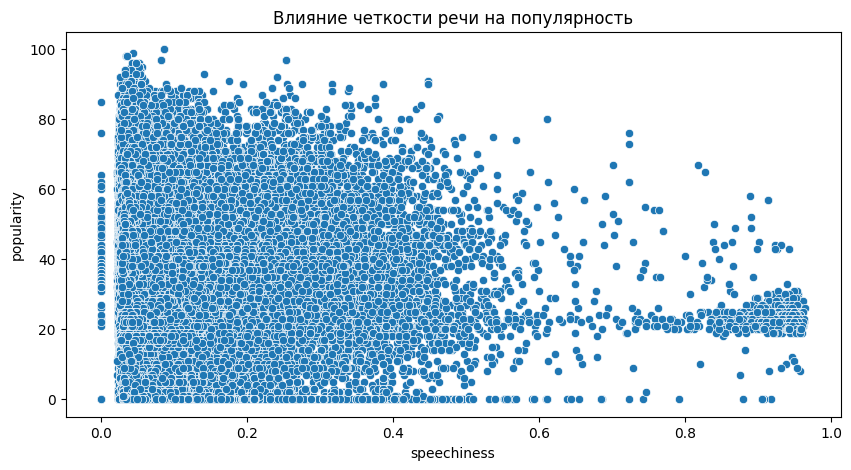

In [33]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x='speechiness', y='popularity', data=data)
plt.title('Влияние четкости речи на популярность')
plt.show()

Ключевые наблюдения:

Обратная корреляция для большинства значений: В целом, наблюдается обратная корреляция между четкостью речи и популярностью, особенно в диапазоне speechiness от 0 до 0.6. Чем выше четкость речи, тем ниже, как правило, популярность трека. Это наиболее заметно в левой части графика, где высокая плотность точек в нижней части (низкая популярность) постепенно снижается к верхней части (высокая популярность).

Высокая плотность при низкой четкости речи: Большая часть треков имеет низкие значения speechiness (менее 0.3). Это говорит о том, что в большинстве треков речь либо отсутствует, либо не является доминирующим элементом.

Разная популярность при высокой четкости речи: В диапазоне speechiness от 0.6 до 1.0 корреляция менее выражена. Здесь треки имеют разную популярность, в основном, среднюю или низкую. Можно заметить горизонтальную полосу точек, что может указывать на треки определенного жанра (например, разговорный жанр).

Редкость очень популярных треков с высокой четкостью речи: Треки с высокой четкостью речи (speechiness > 0.6) редко достигают очень высокой популярности (popularity > 80).

Четкость речи в треке имеет обратную корреляцию с его популярностью. Треки с низкой четкостью речи, как правило, более популярны. Треки с высокой четкостью речи, скорее всего, будут иметь среднюю или низкую популярность, и очень редко становятся очень популярными. Вероятно, это связано с тем, что большинство популярных музыкальных жанров фокусируются на музыке и вокале, а не на разговорной речи. Однако, существуют нишевые жанры, где речь играет важную роль, и это может объяснять наличие точек с высокой четкостью речи на графике.

## Влияние темпа на популярность

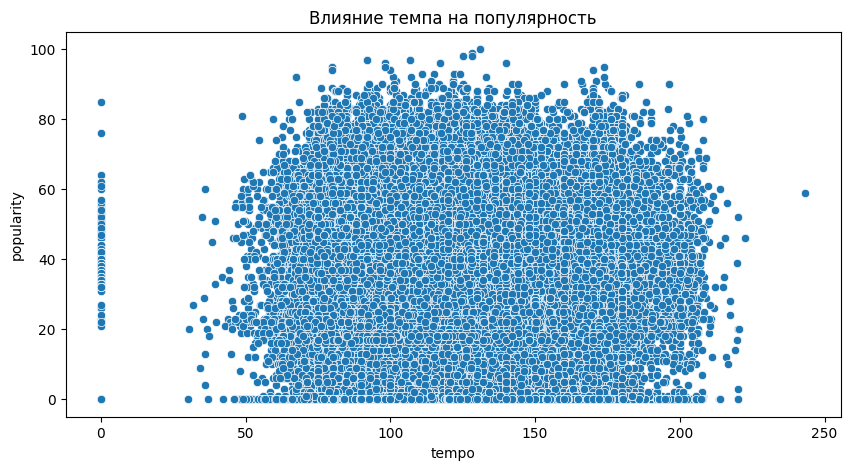

In [34]:
plt.figure(figsize=(10, 5))
sns.scatterplot(x='tempo', y='popularity', data=data)
plt.title('Влияние темпа на популярность')
plt.show()

Ключевые наблюдения:

Неоднозначная зависимость: Зависимость между темпом и популярностью не является линейной и довольно сложная. Наблюдается некоторое скопление точек в области темпа от 50 до 200 ударов в минуту, при этом популярность в этой области варьируется от 0 до 100.

Наиболее популярный диапазон темпа: Самая высокая плотность точек, соответствующих популярным трекам (popularity > 60), наблюдается в диапазоне темпа примерно от 80 до 180 ударов в минуту. Это может указывать на то, что данный диапазон темпа наиболее предпочтителен для широкой аудитории.

Треки с очень низким или высоким темпом менее популярны: Треки с очень низким (меньше 50) или очень высоким (больше 200) темпом, как правило, имеют более низкую популярность. В этих областях плотность точек значительно ниже, и большинство из них сосредоточено в нижней части графика (низкая популярность).

Темп не является единственным фактором: Даже в наиболее популярном диапазоне темпа встречаются треки с низкой популярностью. Это подтверждает, что темп не является единственным фактором, определяющим популярность трека. Другие характеристики музыки, такие как жанр, мелодия, текст и т.д., также играют важную роль.

 Существует определенная связь между темпом и популярностью музыкальных треков. Диапазон темпа от 80 до 180 ударов в минуту можно считать наиболее предпочтительным с точки зрения популярности.

## Мартица корреляци (Все признаки)

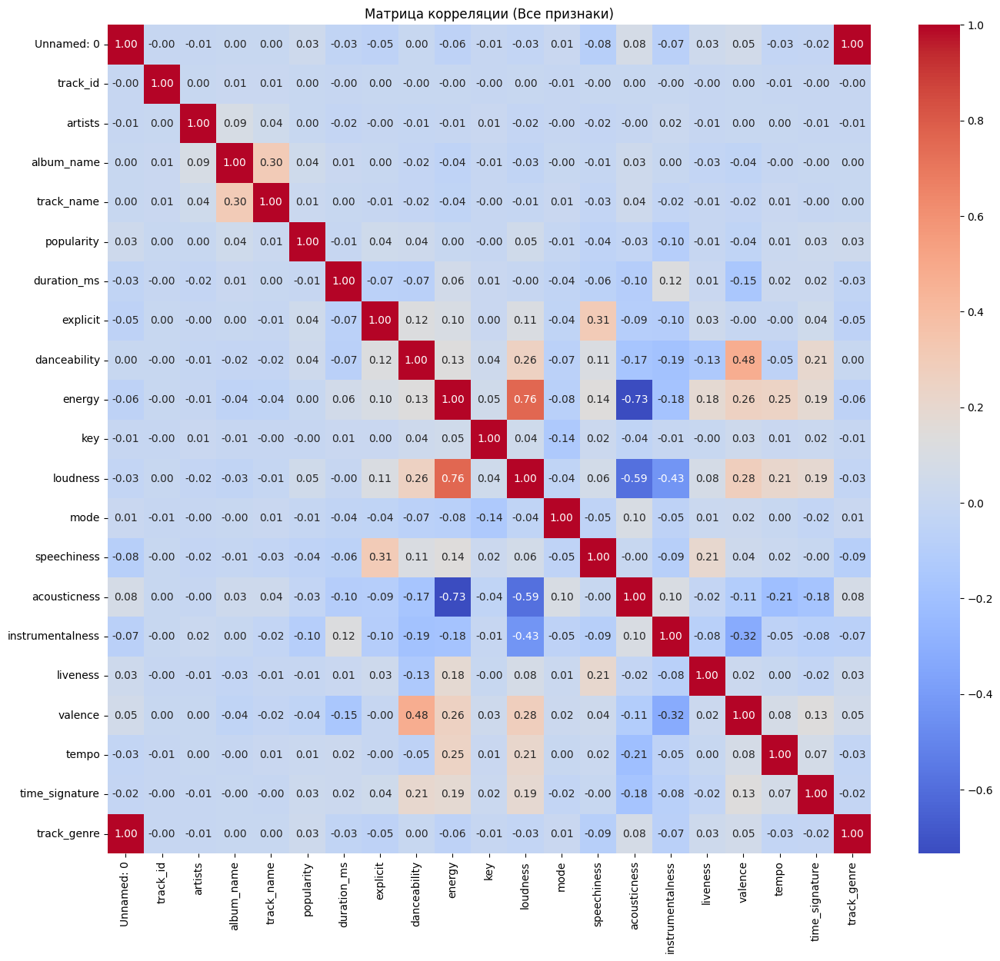

In [35]:
plt.figure(figsize=(16, 14))
sns.heatmap(data.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Матрица корреляции (Все признаки)')
plt.show()

На графике представлена матрица корреляции признаков датасета. Можно сделать следующие выводы:

Сильная положительная корреляция: наблюдается только по главной диагонали (каждый признак сильно коррелирует сам с собой, что ожидаемо).

Заметная положительная корреляция: energy и loudness (0.76), что логично, так как более энергичная музыка обычно громче.

Заметная отрицательная корреляция: acousticness и energy (-0.73) - акустическая музыка, как правило, менее энергичная. Также есть обратная корреляция loudness и acousticness (-0.59).

Большинство признаков слабо коррелируют друг с другом. Это означает, что они вносят различную информацию в описание музыкальных треков и потенциально могут быть полезны для модели машинного обучения.

В целом, матрица корреляции показывает, что в датасете нет сильной мультиколлинеарности (за исключением пары energy-loudness), что является положительным моментом для построения моделей машинного обучения.

## Pairplot для выбранных числовых признаков

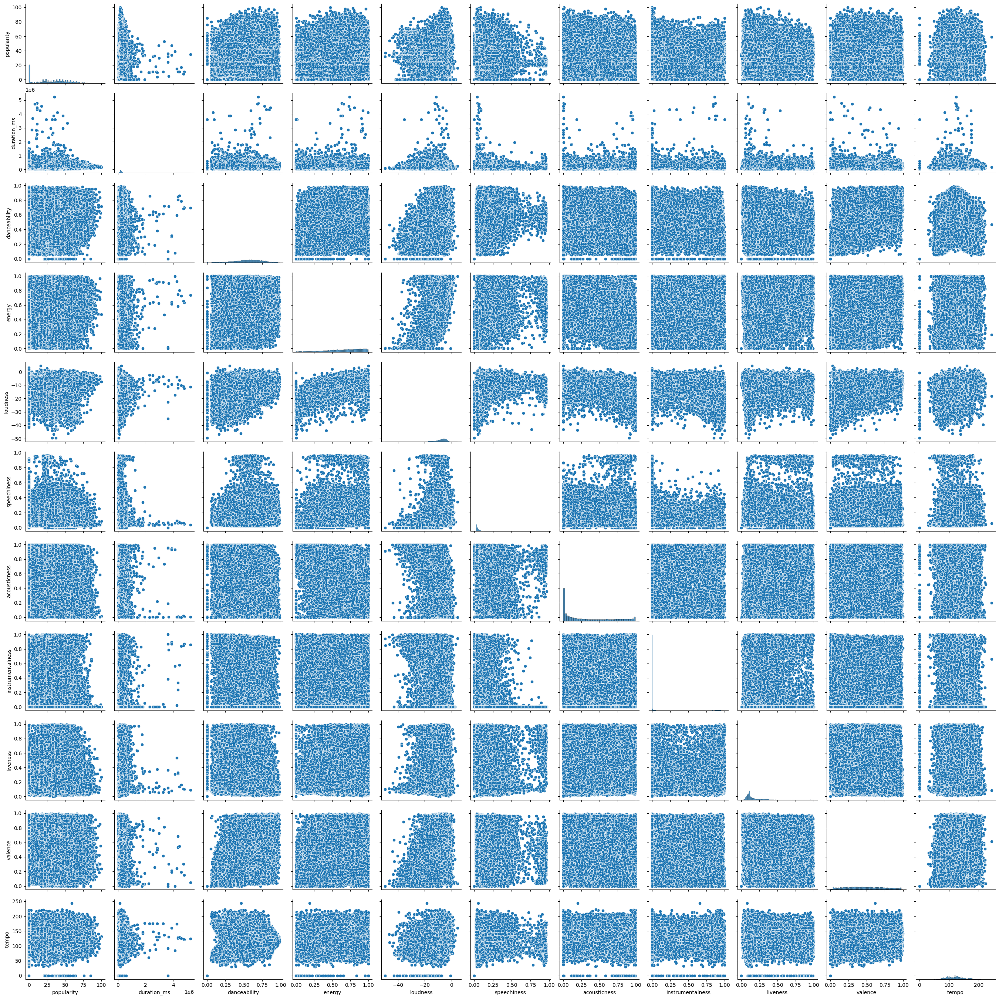

In [36]:
sns.pairplot(data[['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness','liveness', 'valence', 'tempo']])
plt.show()

## Распределение каждого числового признака

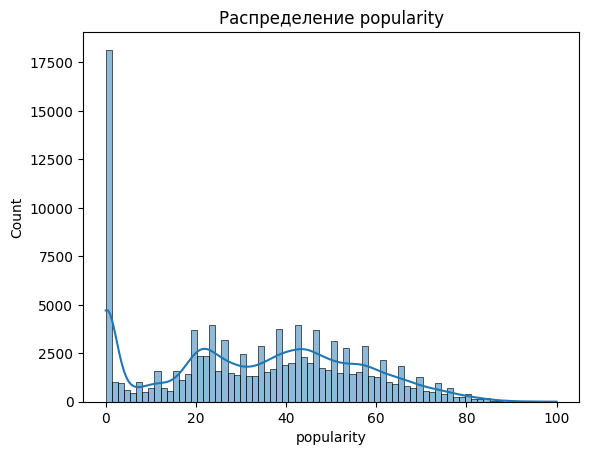

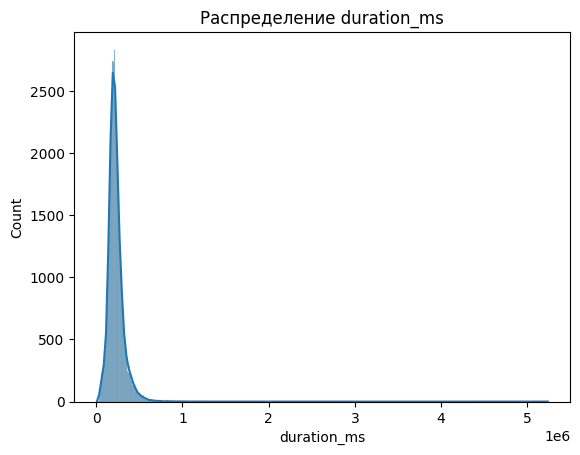

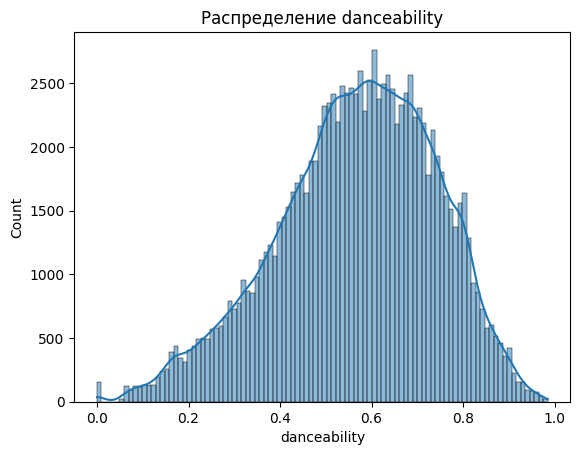

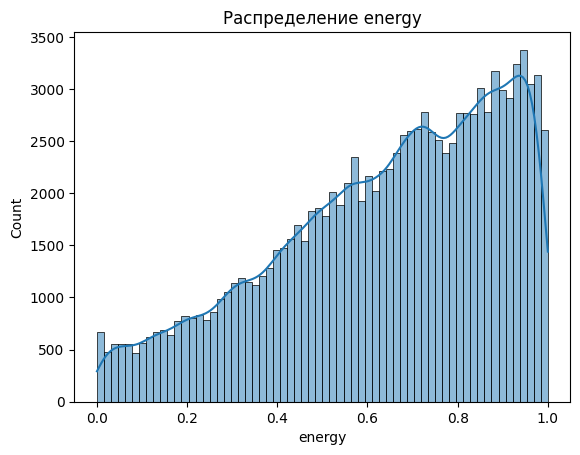

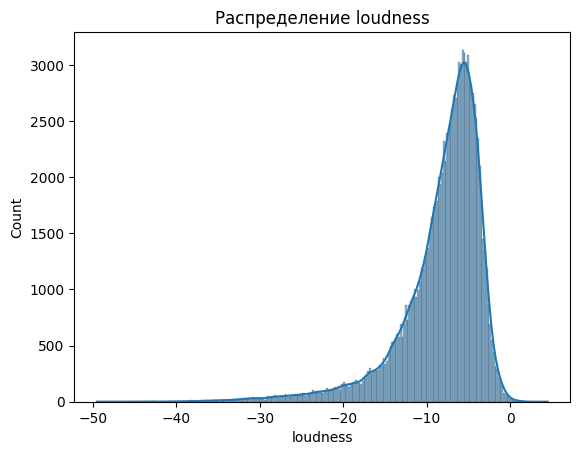

...

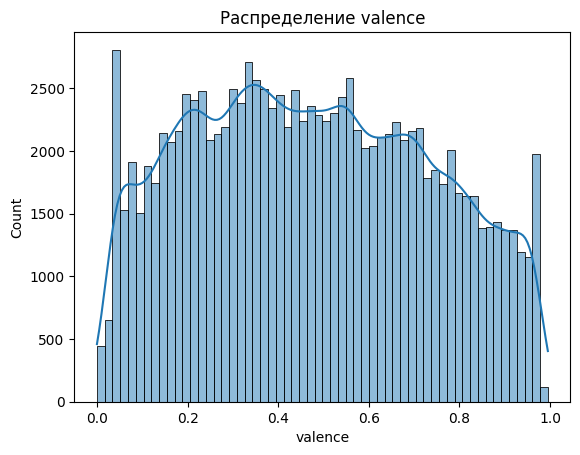

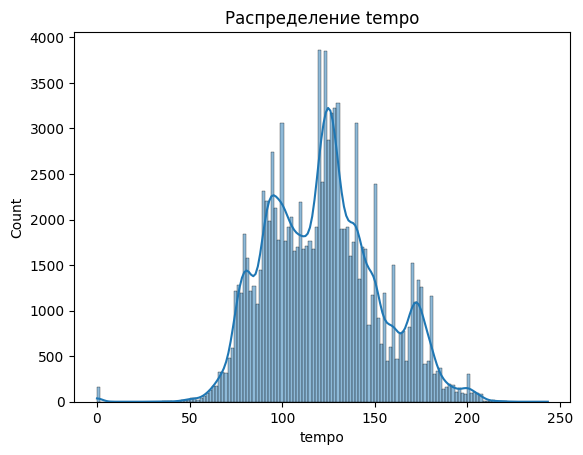

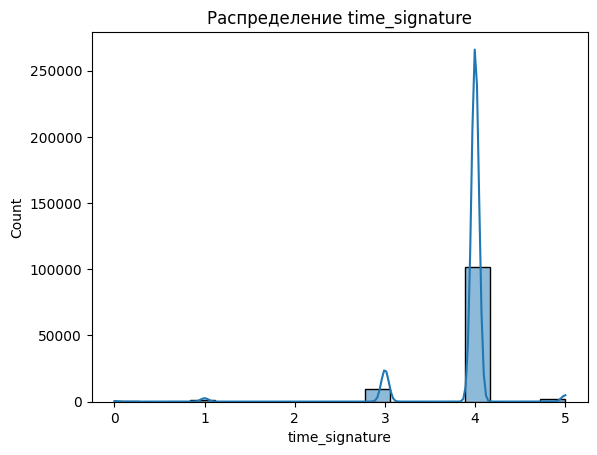

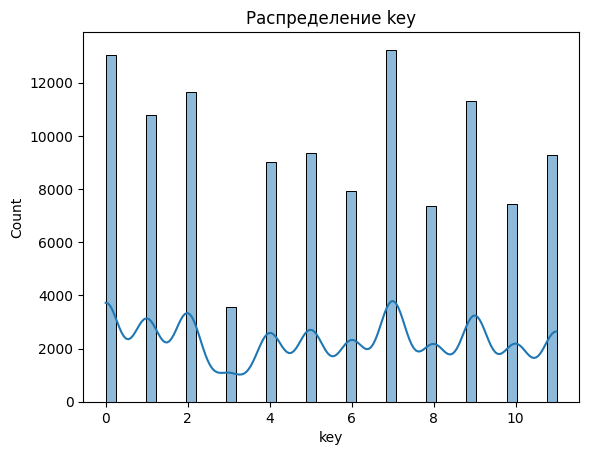

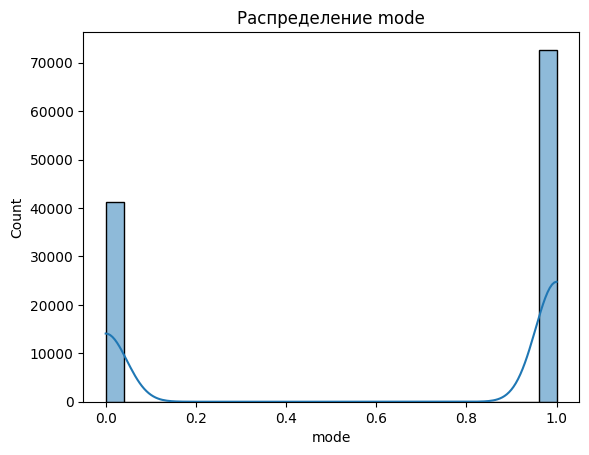

In [37]:
for col in ['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness','liveness', 'valence', 'tempo', 'time_signature', 'key', 'mode']:
    plt.figure()
    sns.histplot(data[col], kde = True)
    plt.title(f'Распределение {col}')
    plt.show()

## Анализ с категориальными признаками

Задание признаку "Ненормативная лексика" категории "Явная" и "Не явная"

In [38]:
data_initial['explicit'].replace({True: 'Явный', False: 'Не явный'}, inplace=True)

<ipython-input-38-6251ad56fef6>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_initial['explicit'].replace({True: 'Явный', False: 'Не явный'}, inplace=True)


### Топ-10 исполнителей по средней популярности

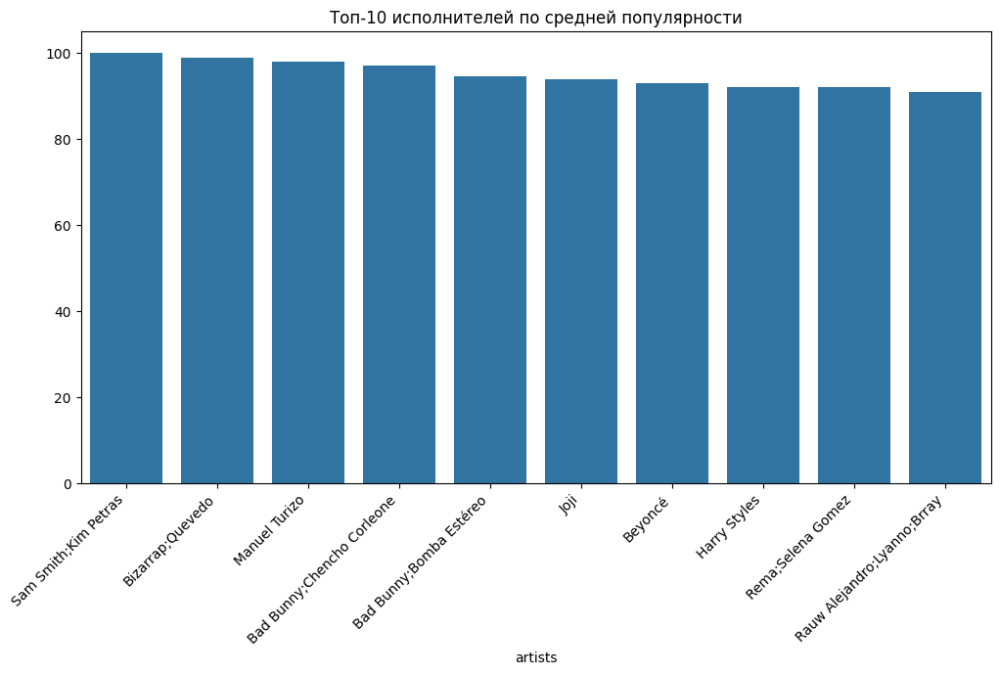

In [39]:
top_artists = data_initial.groupby('artists')['popularity'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_artists.index, y=top_artists.values)
plt.title('Топ-10 исполнителей по средней популярности')
plt.xticks(rotation=45, ha='right')
plt.show()

Основные выводы:

Высокая средняя популярность: Все представленные исполнители имеют очень высокую среднюю популярность, находящуюся в диапазоне от приблизительно 90 до 100.

Незначительные различия: Разница в средней популярности между исполнителями в топ-10 относительно невелика. Лидеры рейтинга не сильно оторвались от остальных исполнителей в топ-10.

Sam Smith;Kim Petras и Bizarrap;Quevedo лидируют: Судя по графику, эти два исполнителя имеют самые высокие показатели средней популярности (хотя разница с остальными, как отмечалось, не очень большая).

Rauw Alejandro;Lyanno;Bray — в конце списка: Этот исполнитель имеет наименьшую среднюю популярность среди представленных в топ-10, но она всё равно достаточно высокая (около 90).

### Распределение треков по наличию явной ненормативной лексики

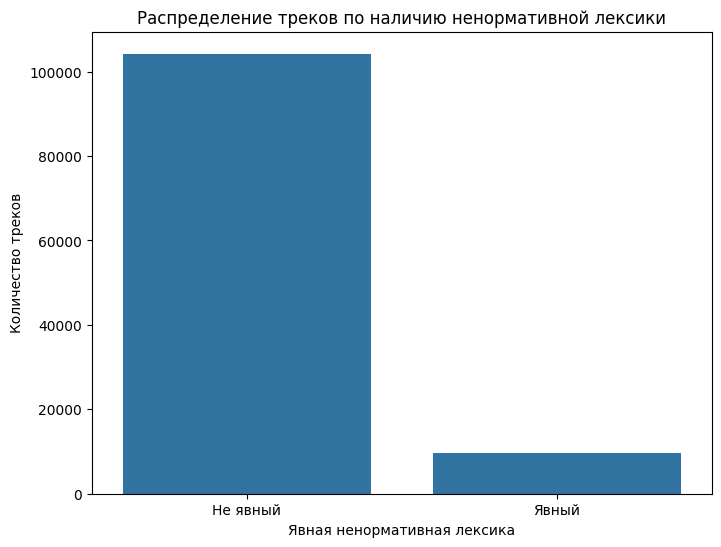

In [40]:
plt.figure(figsize=(8, 6))
sns.countplot(x="explicit", data=data_initial)
plt.title('Распределение треков по наличию ненормативной лексики')
plt.xlabel('Явная ненормативная лексика')
plt.ylabel('Количество треков')
data_initial['explicit'].replace({True: 'Явный', False: 'Не явный'}, inplace=True)
plt.show()

В датасете подавляющее большинство треков не содержат явной ненормативной лексики. Количество треков без ненормативной лексики ("Не явный") значительно больше, чем треков с ней ("Явный").

### Топ-10 альбомов по количеству треков:

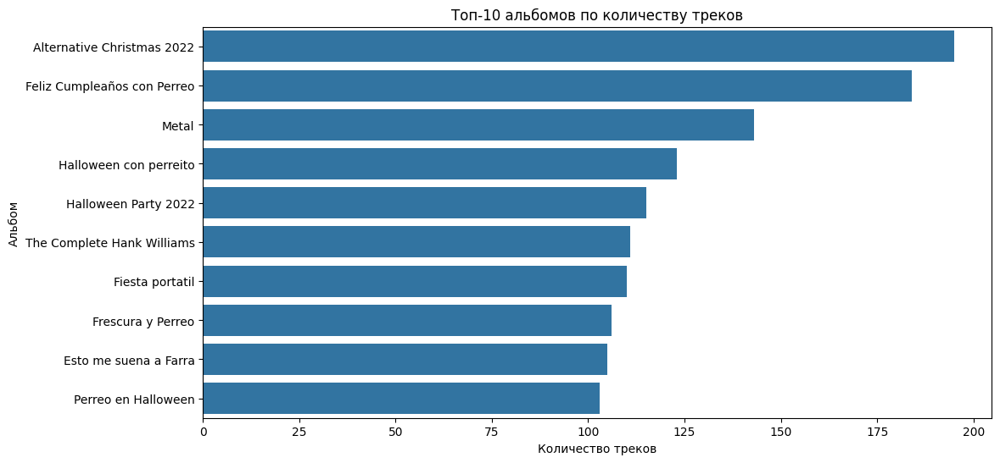

In [41]:
top_albums = data_initial['album_name'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(y=top_albums.index, x=top_albums.values)
plt.title('Топ-10 альбомов по количеству треков')
plt.xlabel('Количество треков')
plt.ylabel('Альбом')
plt.show()

Основные выводы:

"Alternative Christmas 2022" - явный лидер: Альбом "Alternative Christmas 2022" содержит значительно больше треков, чем любой другой альбом в топ-10, почти 200.

Большой разброс значений: Количество треков в альбомах варьируется от чуть более 100 до почти 200. Заметен явный перепад между лидером и остальными альбомами в топ-10.

Плавное убывание: За исключением лидера, количество треков в альбомах уменьшается относительно плавно от второго места к десятому.

Тематика: Судя по названиям ("Halloween," "Perreo," "Fiesta"), значительная часть популярных альбомов, похоже, связана с праздниками или вечеринками. Это может указывать на сезонность данных или на предпочтения пользователей в данном датасете.

### Количество треков по сигнатуре времени

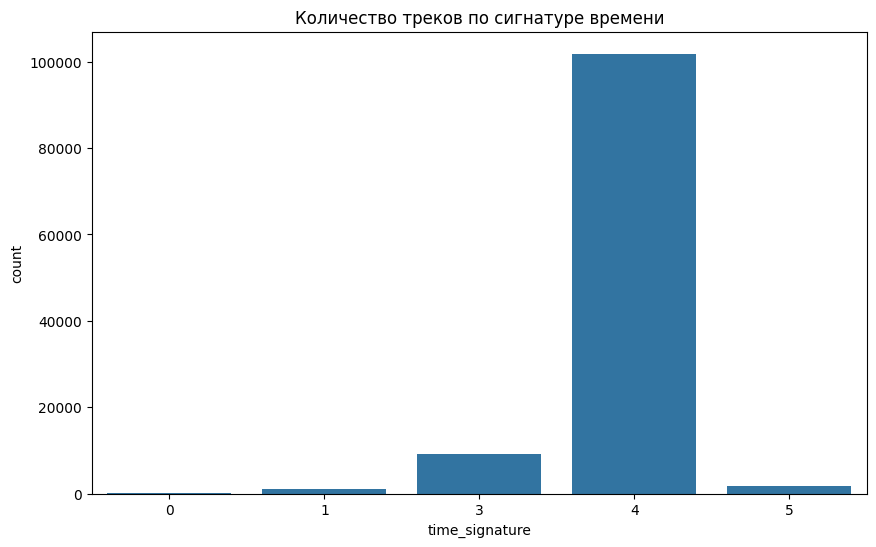

In [42]:
plt.figure(figsize=(10,6))
sns.countplot(x='time_signature', data=data_initial)
plt.title('Количество треков по сигнатуре времени')
plt.show()

Подавляющее большинство треков имеют размер такта, равный 4. Это стандартный размер такта в большинстве музыкальных жанров.

Дополнительные наблюдения:

Значения time_signature: На графике представлены значения размера такта 0, 1, 3, 4 и 5.

Редкие размеры: Размеры такта 0, 1, 3 и 5 встречаются крайне редко по сравнению с размером 4. Значения 0 и 1 выглядят как аномалии или ошибки в данных, так как размер такта обычно обозначается целым числом больше нуля (например, 4/4 - четыре четверти).

### Количество треков для каждой тональности

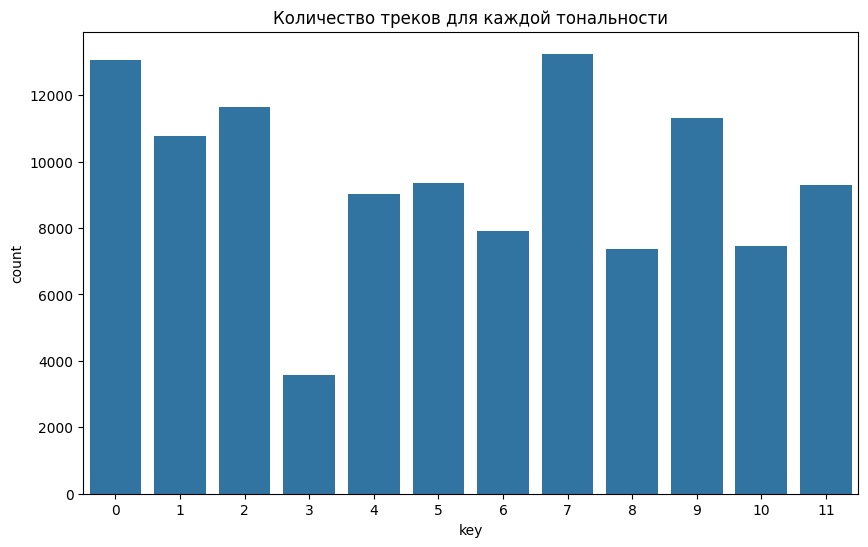

In [43]:
plt.figure(figsize=(10,6))
sns.countplot(x='key', data=data_initial)
plt.title('Количество треков для каждой тональности')
plt.show()

Основные наблюдения:

Неравномерное распределение: Распределение треков по тональностям неравномерное. Некоторые тональности встречаются чаще, чем другие.

Наиболее частые тональности: Тональности 0 и 7 являются наиболее распространенными, имея наибольшее количество треков.

Наименее частая тональность: Тональность 3 встречается реже всего среди представленных.

Относительно высокая частота для большинства тональностей: За исключением тональности 3, остальные тональности имеют относительно схожее количество треков, колеблющееся в диапазоне примерно от 7500 до 13000.

# Разбиение датасета


In [44]:
# Разделение данных на обучающую и тестовую выборки
# X = data.drop(columns=['popularity', 'track_id', 'valence', 'time_signature', 'Unnamed: 0'])  # измените на ваш целевой признак, если необходимо
X = data.drop(columns=['popularity', 'track_id', 'valence', 'time_signature',
                       'Unnamed: 0', 'key', 'mode', 'liveness'])
y = data['popularity']  # измените на ваш целевой признак, если необходимо
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [45]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113999 entries, 0 to 113999
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artists           113999 non-null  int64  
 1   album_name        113999 non-null  int64  
 2   track_name        113999 non-null  int64  
 3   duration_ms       113999 non-null  int64  
 4   explicit          113999 non-null  bool   
 5   danceability      113999 non-null  float64
 6   energy            113999 non-null  float64
 7   loudness          113999 non-null  float64
 8   speechiness       113999 non-null  float64
 9   acousticness      113999 non-null  float64
 10  instrumentalness  113999 non-null  float64
 11  tempo             113999 non-null  float64
 12  track_genre       113999 non-null  int64  
dtypes: bool(1), float64(7), int64(5)
memory usage: 11.4 MB


# Функция для кросс-валидации

In [46]:
!pip install scikeras

In [47]:
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import cross_validate
from scikeras.wrappers import KerasRegressor

In [48]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [49]:
def calculate_cross_validate(model):
    scoring = {
      'mse': 'neg_mean_squared_error',
      'r2': 'r2'
    }

    results = cross_validate(model, X_train, y_train, cv=5, scoring=scoring)

    return results

def print_cross_validate(results):
    mse = -results['test_mse']
    r2 = results['test_r2']

    print("Средний MSE:", round(mse.mean(), 2))
    print("Лучший MSE:", round(mse.min(), 2))
    print()
    print("Средний R^2:", round(r2.mean(), 2))
    print("Лучший R^2:", round(r2.max(), 2))


# Обучение

In [50]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score

Подготовка данных

In [51]:
X = data.drop(columns=['popularity', 'track_id', 'valence', 'time_signature',
                       'Unnamed: 0', 'key', 'mode', 'liveness'])
y = data['popularity']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Масштабирование данных

In [52]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [53]:
def evaluate_model(model, X_train, y_train, X_test, y_test):
    history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2,
                        callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)])
    loss = model.evaluate(X_test, y_test)
    print(f'Test Loss: {loss}')
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    print(f'R2 Score: {r2}')
    return history

## Модель 1

### Обучение

In [54]:
def create_model1():
    model = keras.Sequential([
        keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        keras.layers.Dense(64, activation='relu'),
        keras.layers.Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

model = create_model1()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [55]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,121 (20.00 KB)

 Trainable params: 5,121 (20.00 KB)

 Non-trainable params: 0 (0.00 B)

In [56]:
print("Model 1 - Baseline:")

Model 1 - Baseline:


In [57]:
history = evaluate_model(model, X_train, y_train, X_test, y_test)


Epoch 1/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 15s 5ms/step - loss: 618.0216 - val_loss: 478.2785
Epoch 2/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - loss: 469.4278 - val_loss: 469.1974
Epoch 3/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - loss: 464.0301 - val_loss: 459.8754
Epoch 4/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 14s 2ms/step - loss: 447.5548 - val_loss: 452.5160
Epoch 5/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 445.0995 - val_loss: 445.4059
Epoch 6/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 438.9657 - val_loss: 441.4279
Epoch 7/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 431.3487 - val_loss: 437.1870
Epoch 8/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 429.1694 - val_loss: 433.3242
Epoch 9/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 427.4897 - val_loss: 433.1154
Epoch 10/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 421.6584 - val_loss: 431.3612
Epoch 11/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 4

In [58]:
loss = model.evaluate(X_test, y_test)
print(f'Test Loss: {loss}')

713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 389.6678
Test Loss: 385.8075866699219


### Результаты обучения

In [59]:
y_test.value_counts()

,count
popularity,
0,3228
21,482
22,459
44,455
1,450
...,...
95,2
91,1
93,1


In [60]:
y_test.shape

(22800,)

In [61]:
# Прогнозирование на тестовой выборке
y_pred = model.predict(X_test)

# Вычисление метрик
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f'MAE: {mae:.2f}')
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'R2: {r2:.2f}')
print(f'MAPE: {mape:.2f}%')

713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
MAE: 15.64
MSE: 385.81
RMSE: 19.64
R2: 0.22
MAPE: 16163101798447024.00%


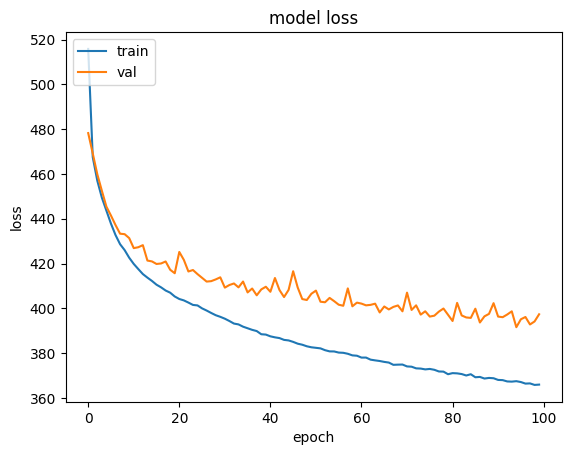

In [62]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

713/713 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━

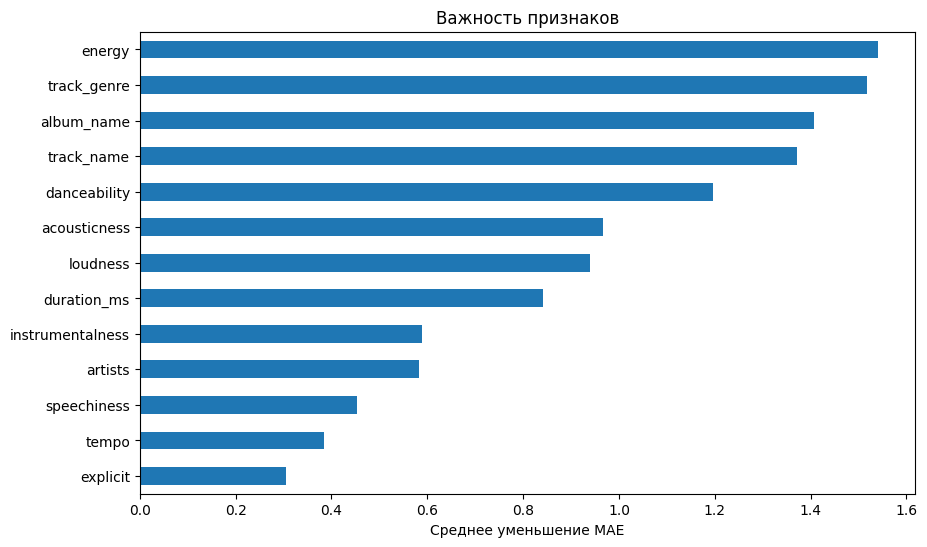

In [63]:
# Важность признаков с помощью permutation importance
result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42, scoring='neg_mean_absolute_error')
importances = pd.Series(result.importances_mean, index=X.columns)

# Визуализация важности признаков
importances.sort_values().plot(kind='barh', figsize=(10,6))
plt.title('Важность признаков')
plt.xlabel('Среднее уменьшение MAE')
plt.show()

### Кросс-валидация

In [64]:
model_wrapper1 = KerasRegressor(model=create_model1, epochs=50, batch_size=32, verbose=0)

In [65]:
cross_val_model1 = calculate_cross_validate(model_wrapper1)
print_cross_validate(cross_val_model1)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/lo

Средний MSE: 399.74
Лучший MSE: 394.67

Средний R^2: 0.2
Лучший R^2: 0.2


## Модель 2

### Обучение

In [66]:
def create_model2():
    model2 = keras.Sequential([
        keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(64, activation='relu'),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation='relu'),
        keras.layers.Dense(1)
    ])

    model2.compile(optimizer='adam', loss='mean_squared_error')

    return model2

model2 = create_model2()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [67]:
model2.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                     │ (None, 128)                 │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,161 (47.50 KB)

 Trainable params: 12,161 (47.50 KB)

 Non-trainable params: 0 (0.00 B)

In [68]:
print("\nModel 2 - Dropout:")


Model 2 - Dropout:


In [69]:
history2 = evaluate_model(model2, X_train, y_train, X_test, y_test)

Epoch 1/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - loss: 614.1296 - val_loss: 470.6994
Epoch 2/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 476.9692 - val_loss: 462.7923
Epoch 3/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 473.3344 - val_loss: 477.8006
Epoch 4/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 462.6892 - val_loss: 449.3057
Epoch 5/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 458.2493 - val_loss: 447.4708
Epoch 6/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 456.6137 - val_loss: 439.1720
Epoch 7/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 445.9947 - val_loss: 436.4982
Epoch 8/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 440.1351 - val_loss: 429.6453
Epoch 9/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 438.7450 - val_loss: 424.5579
Epoch 10/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 429.8756 - val_loss: 422.4115
Epoch 11/100
2280/2280 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 4

In [70]:
loss = model2.evaluate(X_test, y_test)
print(f'Test Loss: {loss}')

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 367.5681
Test Loss: 363.5596008300781


### Результаты обучения

In [71]:
y_test.value_counts()

,count
popularity,
0,3228
21,482
22,459
44,455
1,450
...,...
95,2
91,1
93,1


In [72]:
y_test.shape

(22800,)

In [73]:
# Прогнозирование на тестовой выборке
y_pred = model2.predict(X_test)

# Вычисление метрик
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f'MAE: {mae:.2f}')
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'R2: {r2:.2f}')
print(f'MAPE: {mape:.2f}%')

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MAE: 14.98
MSE: 363.56
RMSE: 19.07
R2: 0.27
MAPE: 15575037674671240.00%


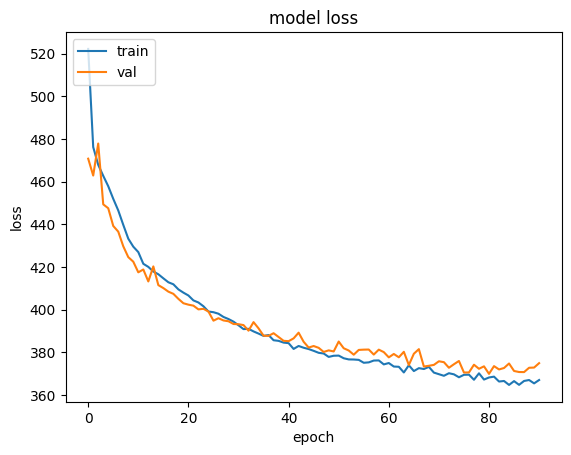

In [74]:
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
713/713 ━━━━━━━━

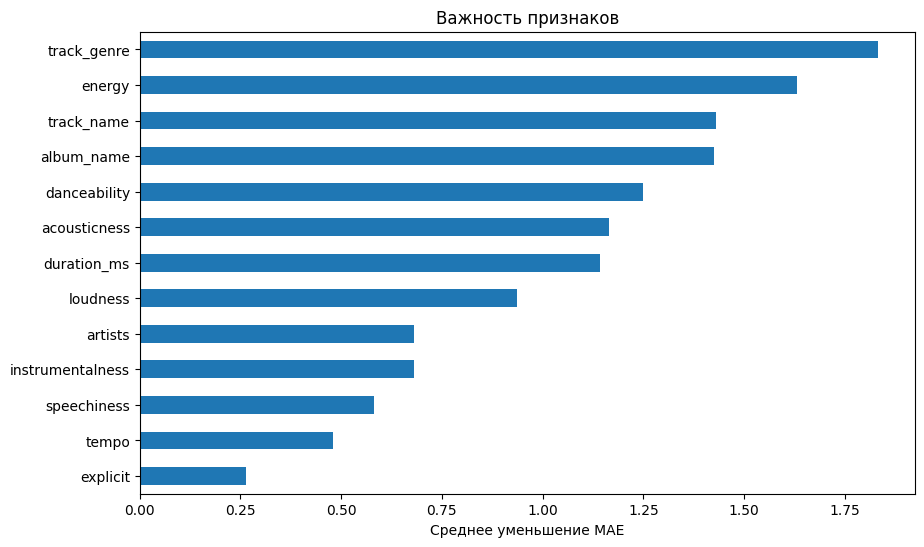

In [75]:
# Важность признаков с помощью permutation importance
result = permutation_importance(model2, X_test, y_test, n_repeats=10, random_state=42, scoring='neg_mean_absolute_error')
importances = pd.Series(result.importances_mean, index=X.columns)

# Визуализация важности признаков
importances.sort_values().plot(kind='barh', figsize=(10,6))
plt.title('Важность признаков')
plt.xlabel('Среднее уменьшение MAE')
plt.show()

### Кросс-валидация

In [76]:
model_wrapper2 = KerasRegressor(model=create_model2, epochs=100, batch_size=32, verbose=0)

In [77]:
cross_val_model2 = calculate_cross_validate(model_wrapper2)
print_cross_validate(cross_val_model2)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/lo

Средний MSE: 365.89
Лучший MSE: 361.15

Средний R^2: 0.27
Лучший R^2: 0.27


## Модель 3 Линейная регрессия


In [78]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense

In [79]:
def create_linear_regression():
  linear_regression = LinearRegression()

  return linear_regression

linear_regression = create_linear_regression()

In [80]:
linear_regression.fit(X_train, y_train)

LinearRegression()

In [81]:
# Прогнозирование на тестовой выборке
y_pred = linear_regression.predict(X_test)

# Вычисление метрик
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f'MAE: {mae:.2f}')
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'R2: {r2:.2f}')
print(f'MAPE: {mape:.2f}%')

MAE: 18.51
MSE: 488.19
RMSE: 22.10
R2: 0.02
MAPE: 21548528382144684.00%


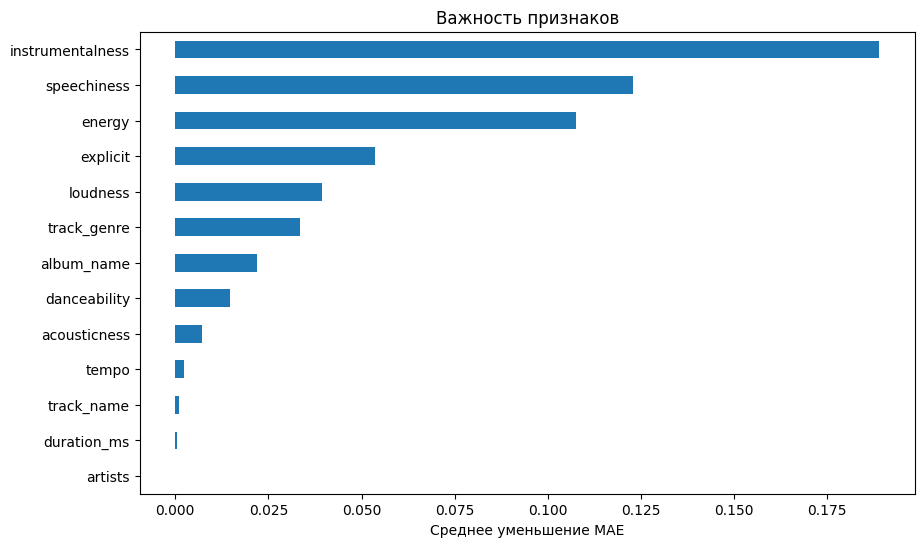

In [82]:
# Важность признаков с помощью permutation importance
result = permutation_importance(linear_regression, X_test, y_test, n_repeats=10, random_state=42, scoring='neg_mean_absolute_error')
importances = pd.Series(result.importances_mean, index=X.columns)

# Визуализация важности признаков
importances.sort_values().plot(kind='barh', figsize=(10,6))
plt.title('Важность признаков')
plt.xlabel('Среднее уменьшение MAE')
plt.show()

### Кросс-валидация

In [83]:
cross_validate_linear = calculate_cross_validate(create_linear_regression())
print_cross_validate(cross_validate_linear)

Средний MSE: 488.16
Лучший MSE: 483.71

Средний R^2: 0.02
Лучший R^2: 0.02


## Модель 4 Дерево решений

In [84]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense

In [86]:
def create_random_forest():
  random_forest = RandomForestRegressor(
      random_state=42,
      max_depth=14,
      min_samples_leaf=1,
      min_samples_split=2,
      n_estimators=15
  )

  return random_forest

random_forest = create_random_forest()

In [88]:
random_forest.fit(X_train, y_train)

RandomForestRegressor(max_depth=14, n_estimators=15, random_state=42)

In [89]:
# Прогнозирование на тестовой выборке
y_pred = random_forest.predict(X_test)

# Вычисление метрик
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f'MAE: {mae:.2f}')
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'R2: {r2:.2f}')
print(f'MAPE: {mape:.2f}%')

MAE: 13.50
MSE: 300.12
RMSE: 17.32
R2: 0.40
MAPE: 12839931543627752.00%


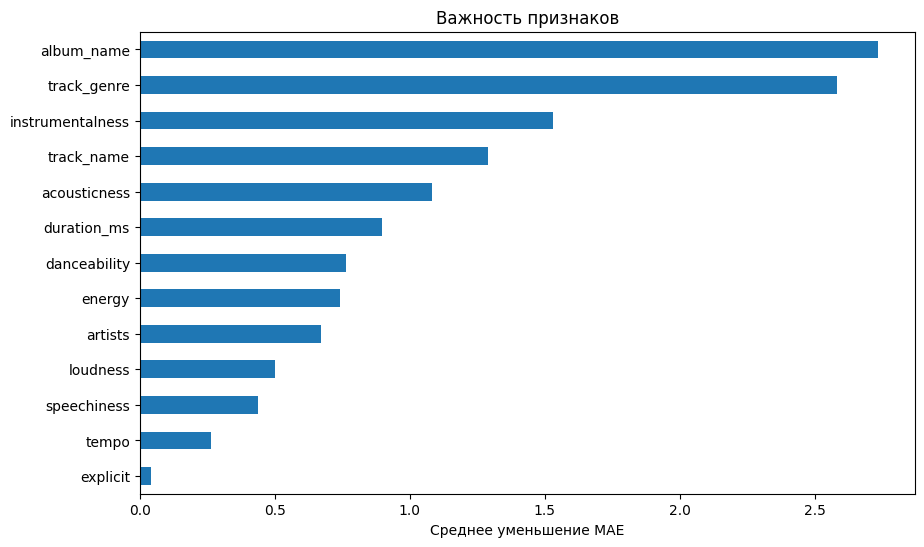

In [90]:
result = permutation_importance(random_forest, X_test, y_test, n_repeats=10, random_state=42, scoring='neg_mean_absolute_error')
importances = pd.Series(result.importances_mean, index=X.columns)

# Визуализация важности признаков
importances.sort_values().plot(kind='barh', figsize=(10,6))
plt.title('Важность признаков')
plt.xlabel('Среднее уменьшение MAE')
plt.show()

### Кросс-валидация

In [98]:
cross_val_decision_tree = calculate_cross_validate(create_random_forest())
print_cross_validate(cross_val_decision_tree)

Средний MSE: 311.49
Лучший MSE: 307.41

Средний R^2: 0.37
Лучший R^2: 0.38


## Модель 5 Градиентный бустинг

In [91]:
from xgboost import XGBRegressor

In [92]:
def create_xgb():
  xgb = XGBRegressor(
      random_state=42,
      colsample_bytree=1.0,
      learning_rate=0.2,
      max_depth=7,
      n_estimators=300,
      subsample=1.0
  )
  return xgb

xgb = create_xgb()

In [93]:
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=1.0, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.2, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=300, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [94]:
# Прогнозирование на тестовой выборке
y_pred = xgb.predict(X_test)

# Вычисление метрик
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f'MAE: {mae:.2f}')
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f}')
print(f'R2: {r2:.2f}')
print(f'MAPE: {mape:.2f}%')

MAE: 10.08
MSE: 185.01
RMSE: 13.60
R2: 0.63
MAPE: 8404200033417930.00%


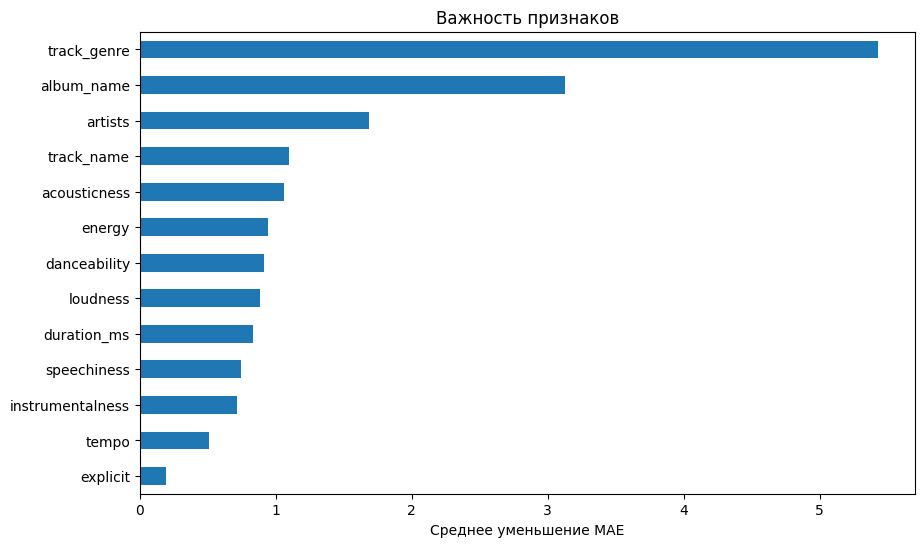

In [95]:
result = permutation_importance(xgb, X_test, y_test, n_repeats=10, random_state=42, scoring='neg_mean_absolute_error')
importances = pd.Series(result.importances_mean, index=X.columns)

# Визуализация важности признаков
importances.sort_values().plot(kind='barh', figsize=(10,6))
plt.title('Важность признаков')
plt.xlabel('Среднее уменьшение MAE')
plt.show()

### Кросс-валидация

In [99]:
cross_val_xgb = calculate_cross_validate(create_xgb())
print_cross_validate(cross_val_xgb)

Средний MSE: 195.74
Лучший MSE: 191.55

Средний R^2: 0.61
Лучший R^2: 0.61


# Сравнение всех моделей

In [102]:
print('model1')
print('='*20)
print_cross_validate(cross_val_model1)
print('='*20)
print()

print('model2')
print('='*20)
print_cross_validate(cross_val_model2)
print('='*20)
print()

print('Линейная')
print('='*20)
print_cross_validate(cross_validate_linear)
print('='*20)
print()

print('Random Forest')
print('='*20)
print_cross_validate(cross_val_decision_tree)
print('='*20)
print()

print('Градиентный бустинг')
print('='*20)
print_cross_validate(cross_val_xgb)

model1
Средний MSE: 399.74
Лучший MSE: 394.67

Средний R^2: 0.2
Лучший R^2: 0.2

model2
Средний MSE: 365.89
Лучший MSE: 361.15

Средний R^2: 0.27
Лучший R^2: 0.27

Линейная
Средний MSE: 488.16
Лучший MSE: 483.71

Средний R^2: 0.02
Лучший R^2: 0.02

Random Forest
Средний MSE: 311.49
Лучший MSE: 307.41

Средний R^2: 0.37
Лучший R^2: 0.38

Градиентный бустинг
Средний MSE: 195.74
Лучший MSE: 191.55

Средний R^2: 0.61
Лучший R^2: 0.61


Градиентный бустинг показал наилучшие результаты: У него самые низкие значения MSE (195.74 среднее и 191.55 лучшее) и самый высокий R^2 (0.61). Это говорит о том, что градиентный бустинг наиболее точно предсказывает целевую переменную среди рассмотренных моделей.

Random Forest: Эта модель показала вторые по качеству результаты с относительно невысоким MSE (311.49 среднее, 307.41 лучшее) и R^2 = 0.37 (среднее) и 0.38 (лучшее).

model2 лучше model1: model2 имеет более низкий средний и лучший MSE по сравнению с model1, а также более высокий R^2.

Линейная модель показала наихудшие результаты: У нее самый высокий MSE (488.16) и очень низкий R^2 (0.02), что свидетельствует о плохой предсказательной способности модели для данной задачи.

# Вывод


В ходе данной работы был проведен анализ датасета музыкальных треков. Были исследованы распределения различных признаков. Для решения задачи регрессии были обучены и оценены несколько моделей машинного обучения: нейронные сети, линейная регрессия, Random Forest и градиентный бустинг. Произведено сравнение качества моделей по метрикам MSE и R^2. Результаты показали, что градиентный бустинг продемонстрировал наилучшее качество предсказания популярности треков по сравнению с другими рассмотренными моделями. Работа позволила получить практический опыт в анализе данных, визуализации и применении моделей машинного обучения для решения задачи регрессии.